In [1]:
import numpy as np
from plyfile import PlyData, PlyElement
from sklearn.cluster import DBSCAN
import plotly.graph_objs as go
from plotly.subplots import make_subplots

In [2]:
plydata = PlyData.read('point_cloud.ply')

In [25]:
x = plydata['vertex']['x']
y = plydata['vertex']['y']
z = plydata['vertex']['z']
points = np.array([x, y, z]).T

## DBSCAN

In [40]:
def cluster(points, eps=0.5, min_samples=2):
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    labels = dbscan.fit_predict(points)
    return labels

def plot_clusters(points, labels):
    fig = go.Figure()

    unique_labels = np.unique(labels)
    for label in unique_labels:
        cluster_points = points[labels == label]
        fig.add_trace(go.Scatter3d(
            x=cluster_points[:, 0],
            y=cluster_points[:, 1],
            z=cluster_points[:, 2],
            mode='markers',
            marker=dict(size=2),
            name=f'Cluster {label}' if label != -1 else 'Noise'
        ))

    fig.update_layout(
        scene=dict(
            xaxis_title='X',
            yaxis_title='Y',
            zaxis_title='Z'
        ),
        title="DBSCAN 3D Clustering"
    )

    fig.show()

labels = cluster(points, eps=0.8, min_samples=40)
plot_clusters(points, labels)


### HDBSCAN

In [41]:
import numpy as np
import hdbscan
import plotly.graph_objs as go


def hdbscan_clustering(points, min_cluster_size=10):
    clusterer = hdbscan.HDBSCAN(min_cluster_size=min_cluster_size)
    labels = clusterer.fit_predict(points)
    return labels, clusterer

def plot_clusters(points, labels):
    fig = go.Figure()

    unique_labels = np.unique(labels)
    for label in unique_labels:
        cluster_points = points[labels == label]
        fig.add_trace(go.Scatter3d(
            x=cluster_points[:, 0],
            y=cluster_points[:, 1],
            z=cluster_points[:, 2],
            mode='markers',
            marker=dict(size=5),
            name=f'Cluster {label}' if label != -1 else 'Noise'
        ))

    fig.update_layout(
        scene=dict(
            xaxis_title='X',
            yaxis_title='Y',
            zaxis_title='Z'
        ),
        title="HDBSCAN 3D Clustering"
    )

    fig.show()

labels, clusterer = hdbscan_clustering(points)
plot_clusters(points, labels)


In [42]:
def plot_clusters_with_probabilities(points, labels, probabilities):
    fig = go.Figure()

    unique_labels = np.unique(labels)
    for label in unique_labels:
        cluster_points = points[labels == label]
        cluster_probabilities = probabilities[labels == label]
        fig.add_trace(go.Scatter3d(
            x=cluster_points[:, 0],
            y=cluster_points[:, 1],
            z=cluster_points[:, 2],
            mode='markers',
            marker=dict(size=5, color=cluster_probabilities, colorscale='Viridis'),
            name=f'Cluster {label}' if label != -1 else 'Noise'
        ))

    fig.update_layout(
        scene=dict(
            xaxis_title='X',
            yaxis_title='Y',
            zaxis_title='Z'
        ),
        title="HDBSCAN 3D Clustering with Probabilities"
    )

    fig.show()

probabilities = clusterer.probabilities_

plot_clusters_with_probabilities(points, labels, probabilities)


## Gaussian Mixture Model

Best number of components according to AIC: 46
Best number of components according to BIC: 46


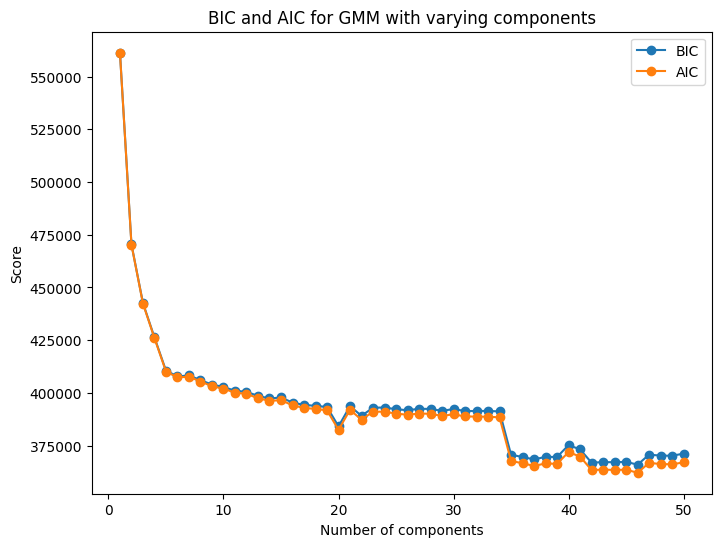

In [29]:
import numpy as np
from sklearn.mixture import GaussianMixture
import plotly.graph_objs as go
import matplotlib.pyplot as plt


def find_best_gmm(points, max_components=10):
    aic_scores = []
    bic_scores = []
    models = []

    for n_components in range(1, max_components + 1):
        gmm = GaussianMixture(n_components=n_components, random_state=42)
        gmm.fit(points)
        models.append(gmm)
        aic_scores.append(gmm.aic(points))
        bic_scores.append(gmm.bic(points))

    best_aic_n = np.argmin(aic_scores) + 1 
    best_bic_n = np.argmin(bic_scores) + 1

    return best_aic_n, best_bic_n, aic_scores, bic_scores

def cluster(points, n_components):
    gmm = GaussianMixture(n_components=n_components, random_state=42)
    labels = gmm.fit_predict(points)
    return labels

def plot_clusters(points, labels):
    fig = go.Figure()

    unique_labels = np.unique(labels)
    for label in unique_labels:
        cluster_points = points[labels == label]
        fig.add_trace(go.Scatter3d(
            x=cluster_points[:, 0],
            y=cluster_points[:, 1],
            z=cluster_points[:, 2],
            mode='markers',
            marker=dict(size=2),
            name=f'Cluster {label}'
        ))

    fig.update_layout(
        scene=dict(
            xaxis_title='X',
            yaxis_title='Y',
            zaxis_title='Z'
        ),
        title="GMM 3D Clustering"
    )

    fig.show()

    
def plot_aic_bic(n_components_range, aic_scores, bic_scores):
    plt.figure(figsize=(8, 6))
    plt.plot(n_components_range, bic_scores, label='BIC', marker='o')
    plt.plot(n_components_range, aic_scores, label='AIC', marker='o')
    plt.xlabel('Number of components')
    plt.ylabel('Score')
    plt.title('BIC and AIC for GMM with varying components')
    plt.legend()
    plt.show()


max_components = 50
best_aic_n, best_bic_n, aic_scores, bic_scores = find_best_gmm(points, max_components=max_components)

print(f"Best number of components according to AIC: {best_aic_n}")
print(f"Best number of components according to BIC: {best_bic_n}")

labels = cluster(points, n_components=best_bic_n)  # You can choose best_aic_n or best_bic_n
plot_clusters(points, labels)
plot_aic_bic(range(1, max_components + 1), aic_scores, bic_scores)


## Density Plot

### Find best bandwidth

In [31]:
import numpy as np
import plotly.graph_objs as go
from sklearn.neighbors import KernelDensity
from sklearn.model_selection import GridSearchCV

In [33]:
bandwidths = np.linspace(0.1, 1.0, 30)

grid = GridSearchCV(KernelDensity(),
                    {'bandwidth': bandwidths},
                    cv=5) 

grid.fit(points)

best_bandwidth = grid.best_estimator_.bandwidth
print(f"Best bandwidth: {best_bandwidth}")

Best bandwidth: 0.6275862068965516


### Density Color-Coding

In [34]:
def fit_density(points, bandwidth):
    kde = KernelDensity(bandwidth=bandwidth)
    kde.fit(points)

    return kde

def plot_density_color_coding(points, kde):
    log_density = kde.score_samples(points)
    density = np.exp(log_density)  
    fig = go.Figure()

    fig.add_trace(go.Scatter3d(
        x=points[:, 0],
        y=points[:, 1],
        z=points[:, 2],
        mode='markers',
        marker=dict(
            size=5,
            color=density, 
            colorscale='Viridis',
            colorbar=dict(title='Density'),
            opacity=0.8
        )
    ))

    fig.update_layout(
        scene=dict(
            xaxis_title='X',
            yaxis_title='Y',
            zaxis_title='Z'
        ),
        title="3D Point Cloud with Density Color-Coding"
    )

    fig.show()

kde = fit_density(points, bandwidth=best_bandwidth)
plot_density_color_coding(points, kde)


### Isosurfaces

In [35]:
def plot_density_isosurface(points, kde):
    x = np.linspace(0, 1, 30)
    y = np.linspace(0, 1, 30)
    z = np.linspace(0, 1, 30)
    X, Y, Z = np.meshgrid(x, y, z)
    grid_coords = np.vstack([X.ravel(), Y.ravel(), Z.ravel()]).T

    log_density = kde.score_samples(grid_coords)
    density = np.exp(log_density).reshape(X.shape)
    fig = go.Figure(data=go.Isosurface(
        x=X.ravel(),
        y=Y.ravel(),
        z=Z.ravel(),
        value=density.ravel(),
        isomin=0.01,  
        isomax=np.max(density),
        surface_count=5, 
        colorscale="Viridis", 
        caps=dict(x_show=False, y_show=False, z_show=False)
    ))

    fig.update_layout(
        scene=dict(
            xaxis_title='X',
            yaxis_title='Y',
            zaxis_title='Z'
        ),
        title="Isosurface of 3D Point Cloud Density"
    )

    fig.show()

plot_density_isosurface(points, kde)

### 2D Projection

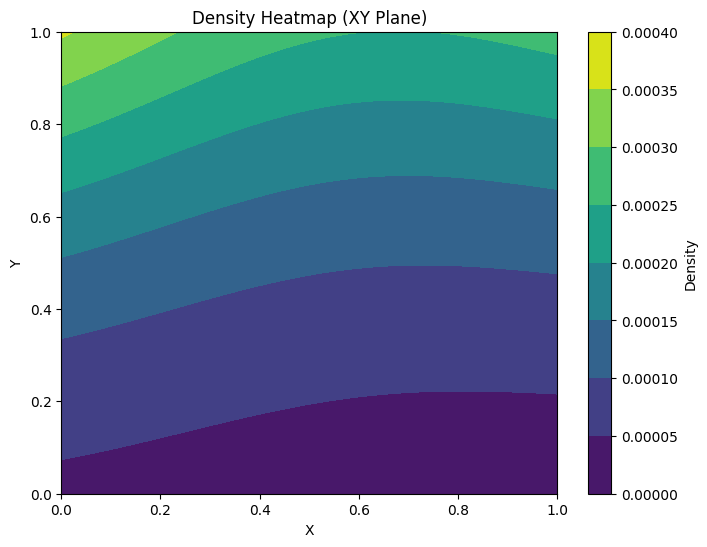

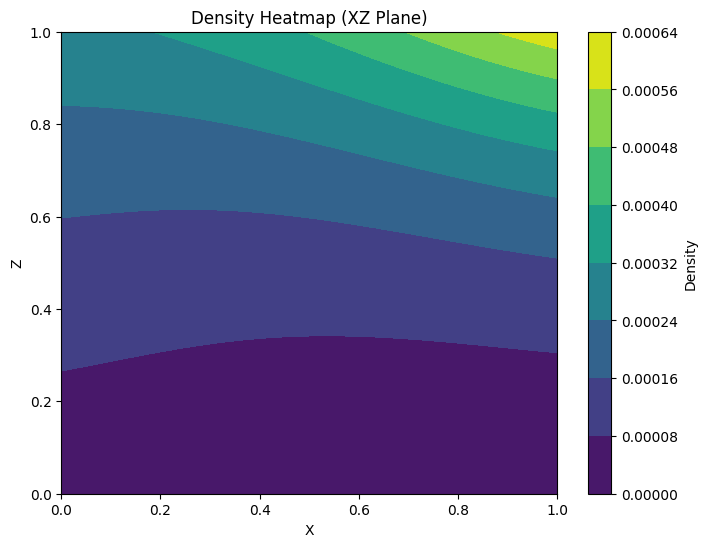

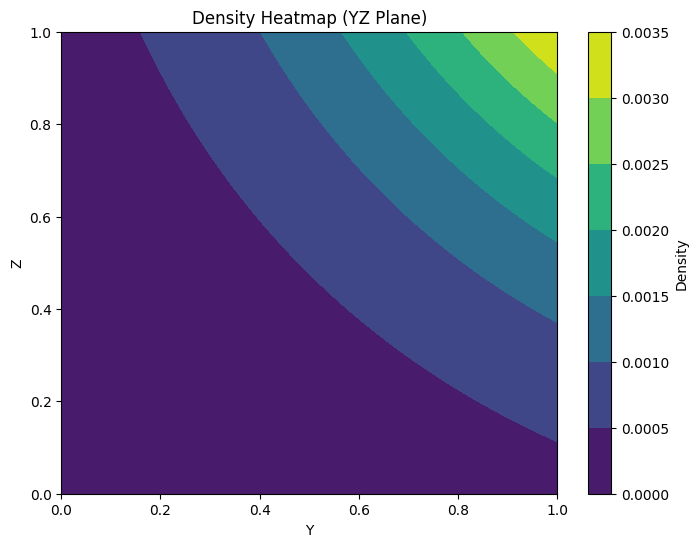

In [36]:
import numpy as np
import matplotlib.pyplot as plt

def plot_density_2d_projection(points, kde):
    grid_size = 100
    x = np.linspace(0, 1, grid_size)
    y = np.linspace(0, 1, grid_size)
    X, Y = np.meshgrid(x, y)

    xy_coords = np.vstack([X.ravel(), Y.ravel()]).T
    xy_points = np.column_stack([points[:, 0], points[:, 1]])

    xy_density = kde.score_samples(np.column_stack([xy_coords, np.zeros(grid_size**2)]))
    xy_density = np.exp(xy_density).reshape(X.shape)

    plt.figure(figsize=(8, 6))
    plt.contourf(X, Y, xy_density, cmap="viridis")
    plt.title("Density Heatmap (XY Plane)")
    plt.xlabel("X")
    plt.ylabel("Y")
    plt.colorbar(label="Density")
    plt.show()

    xz_coords = np.vstack([X.ravel(), Y.ravel()]).T
    xz_points = np.column_stack([points[:, 0], points[:, 2]])

    xz_density = kde.score_samples(np.column_stack([xz_coords[:, 0], np.zeros(grid_size**2), xz_coords[:, 1]]))
    xz_density = np.exp(xz_density).reshape(X.shape)

    plt.figure(figsize=(8, 6))
    plt.contourf(X, Y, xz_density, cmap="viridis")
    plt.title("Density Heatmap (XZ Plane)")
    plt.xlabel("X")
    plt.ylabel("Z")
    plt.colorbar(label="Density")
    plt.show()

    yz_coords = np.vstack([X.ravel(), Y.ravel()]).T
    yz_points = np.column_stack([points[:, 1], points[:, 2]])

    yz_density = kde.score_samples(np.column_stack([np.zeros(grid_size**2), yz_coords[:, 0], yz_coords[:, 1]]))
    yz_density = np.exp(yz_density).reshape(X.shape)

    plt.figure(figsize=(8, 6))
    plt.contourf(X, Y, yz_density, cmap="viridis")
    plt.title("Density Heatmap (YZ Plane)")
    plt.xlabel("Y")
    plt.ylabel("Z")
    plt.colorbar(label="Density")
    plt.show()

plot_density_2d_projection(points, kde)